In [1]:
import os
import numpy as np

import torch
from torch import nn

import torchvision
from torchvision import datasets, transforms

from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader, random_split
from torch.utils.data import ConcatDataset

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Try to get torchinfo for summary of model, install it if it doesn't work
try:
    from torchinfo import summary
except:
    !pip install -q torchinfo
    from torchinfo import summary


In [2]:
from utils.accuracy import accuracy
from utils.train_test import *

In [3]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Constants

In [4]:
# Image size
H = 28
W = 28

# Dataloader
BATCH_SIZE = 64
WORKERS = os.cpu_count()

# Model
INPUT_VECTOR_SIZE = 100

# Training
REAL_LABEL = 1.
FAKE_LABEL = 0.

GPU_NUMBER = 1

# Transform

In [5]:
transform = transforms.Compose([
    transforms.Resize(size=(H, W)),
    transforms.RandomRotation((-15, 15)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5))
])

# MNIST Dataset

In [6]:
dataset = datasets.MNIST(root='./data', download=False,transform=transform)
classes = dataset.classes

len(dataset), classes

(60000,
 ['0 - zero',
  '1 - one',
  '2 - two',
  '3 - three',
  '4 - four',
  '5 - five',
  '6 - six',
  '7 - seven',
  '8 - eight',
  '9 - nine'])

# Dataloader

In [7]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=WORKERS)

dataloader

# Examples

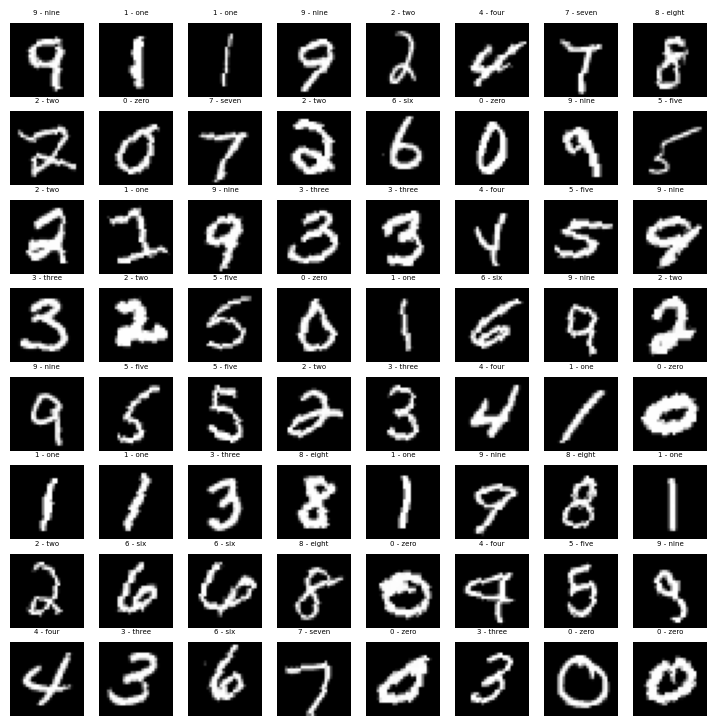

In [8]:
fig = plt.figure(figsize=(9, 9))
rows, cols = 8, 8
for i in range(1, rows*cols+1):
  random_idx = torch.randint(0, len(dataset), size=[1]).item()
  image, true_label = dataset[random_idx]

  fig.add_subplot(rows, cols, i)
  plt.imshow(image.permute(1, 2, 0), cmap="gray")

  plt.title(f"{classes[true_label]}", fontsize=5)
  plt.axis(False)

# Generator model

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.features = nn.Sequential(
            nn.ConvTranspose2d( INPUT_VECTOR_SIZE, 64 * 2, 7, 1, 0, bias=False),
            nn.BatchNorm2d(64 * 2),
            nn.ReLU(),
            nn.ConvTranspose2d( 64 * 2, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.features(input)

In [10]:
model_gen = Generator().to(device)

if (device == 'cuda') and (GPU_NUMBER > 1):
    model_gen = nn.DataParallel(model_gen, list(range(GPU_NUMBER)))

In [11]:
summary(model=model_gen, input_size = (1, INPUT_VECTOR_SIZE, 1, 1), col_names=["input_size", "output_size", "num_params", "trainable"], col_width=20, row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
Generator (Generator)                    [1, 100, 1, 1]       [1, 1, 28, 28]       --                   True
├─Sequential (features)                  [1, 100, 1, 1]       [1, 1, 28, 28]       --                   True
│    └─ConvTranspose2d (0)               [1, 100, 1, 1]       [1, 128, 7, 7]       627,200              True
│    └─BatchNorm2d (1)                   [1, 128, 7, 7]       [1, 128, 7, 7]       256                  True
│    └─ReLU (2)                          [1, 128, 7, 7]       [1, 128, 7, 7]       --                   --
│    └─ConvTranspose2d (3)               [1, 128, 7, 7]       [1, 64, 14, 14]      131,072              True
│    └─BatchNorm2d (4)                   [1, 64, 14, 14]      [1, 64, 14, 14]      128                  True
│    └─ReLU (5)                          [1, 64, 14, 14]      [1, 64, 14, 14]      --                   --
│    └─ConvTranspo

# Discriminator model

In [12]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(1, 32, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32, 32 * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32 * 2),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32 * 2, 32 * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(32 * 4),
            nn.LeakyReLU(0.2),
            nn.Conv2d(32 * 4, 1, 3, 2, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.features(input)

In [13]:
model_dis = Discriminator().to(device)

if (device == 'cuda') and (GPU_NUMBER > 1):
    model_dis = nn.DataParallel(model_dis, list(range(GPU_NUMBER)))

In [14]:
summary(model=model_dis, input_size = (1, 1, 28, 28), col_names=["input_size", "output_size", "num_params", "trainable"], col_width=20, row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
Discriminator (Discriminator)            [1, 1, 28, 28]       [1, 1, 1, 1]         --                   True
├─Sequential (features)                  [1, 1, 28, 28]       [1, 1, 1, 1]         --                   True
│    └─Conv2d (0)                        [1, 1, 28, 28]       [1, 32, 14, 14]      512                  True
│    └─LeakyReLU (1)                     [1, 32, 14, 14]      [1, 32, 14, 14]      --                   --
│    └─Conv2d (2)                        [1, 32, 14, 14]      [1, 64, 7, 7]        32,768               True
│    └─BatchNorm2d (3)                   [1, 64, 7, 7]        [1, 64, 7, 7]        128                  True
│    └─LeakyReLU (4)                     [1, 64, 7, 7]        [1, 64, 7, 7]        --                   --
│    └─Conv2d (5)                        [1, 64, 7, 7]        [1, 128, 3, 3]       131,072              True
│    └─BatchNorm2d

# Pre-trained Classifier model

In [15]:
class TinyMNIST(nn.Module):
  def __init__(self):
    super().__init__()

    hidden = 40
    kernel = 3

    self.conv_block_1 = nn.Sequential(
        nn.Conv2d(1, hidden, 3, stride=1, padding=1, dilation=1, groups=1, bias=True, padding_mode='zeros', device=None, dtype=None),
        nn.ReLU()
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(hidden, hidden, 3, stride=1, padding=1, dilation=1, groups=1, bias=True, padding_mode='zeros', device=None, dtype=None),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )
    self.conv_block_3 = nn.Sequential(
        nn.Conv2d(hidden, hidden, 3, stride=1, padding=1, dilation=1, groups=1, bias=True, padding_mode='zeros', device=None, dtype=None),
        nn.ReLU()
    )
    self.conv_block_4 = nn.Sequential(
        nn.Conv2d(hidden, hidden, 3, stride=1, padding=1, dilation=1, groups=1, bias=True, padding_mode='zeros', device=None, dtype=None),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2)
    )
    self.output = nn.Sequential(
        nn.Flatten(),
        nn.Linear(hidden*7*7, 10)
    )

  def forward(self, x: torch.Tensor) -> torch.Tensor:
    return self.output(self.conv_block_4(self.conv_block_3(self.conv_block_2(self.conv_block_1(x)))))

In [16]:
model_cla = TinyMNIST().to(device)

model_cla.load_state_dict(torch.load('MNIST.pth'))

if (device == 'cuda') and (GPU_NUMBER > 1):
    model_cla = nn.DataParallel(model_cla, list(range(GPU_NUMBER)))

In [17]:
summary(model=model_cla, input_size = (1, 1, 28, 28), col_names=["input_size", "output_size", "num_params", "trainable"], col_width=20, row_settings=["var_names"])

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
TinyMNIST (TinyMNIST)                    [1, 1, 28, 28]       [1, 10]              --                   True
├─Sequential (conv_block_1)              [1, 1, 28, 28]       [1, 40, 28, 28]      --                   True
│    └─Conv2d (0)                        [1, 1, 28, 28]       [1, 40, 28, 28]      400                  True
│    └─ReLU (1)                          [1, 40, 28, 28]      [1, 40, 28, 28]      --                   --
├─Sequential (conv_block_2)              [1, 40, 28, 28]      [1, 40, 14, 14]      --                   True
│    └─Conv2d (0)                        [1, 40, 28, 28]      [1, 40, 28, 28]      14,440               True
│    └─ReLU (1)                          [1, 40, 28, 28]      [1, 40, 28, 28]      --                   --
│    └─MaxPool2d (2)                     [1, 40, 28, 28]      [1, 40, 14, 14]      --                   --
├─Sequential (conv_b

# Loss and optimizers

In [18]:
loss_fn = nn.BCELoss()
loss_fn2 = nn.CrossEntropyLoss()

fixed_noise = torch.randn(64, INPUT_VECTOR_SIZE, 1, 1, device=device)
classes = torch.randint(0, 10, (64,))
classes = torch.nn.functional.one_hot(classes, num_classes=10)
classes = torch.unsqueeze(classes, 2)
classes = torch.unsqueeze(classes, 3)
fixed_noise[:, :10] = classes


# Setup Adam optimizers for both G and D
optimizer_gen = torch.optim.Adam(model_gen.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_dis = torch.optim.Adam(model_dis.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [19]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

In [20]:
# Training Loop
num_epochs = 20
iters = 0
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader):
        true_class_labels = torch.nn.functional.one_hot(data[1], num_classes=10)
        true_class_labels = torch.unsqueeze(true_class_labels, 2)
        true_class_labels = torch.unsqueeze(true_class_labels, 3).to(device)
        ## Train discriminator on real images

        # Create data and labels
        real_images = data[0].to(device)
        local_batch_size = real_images.size(0)
        true_labels = torch.full((local_batch_size,), REAL_LABEL, dtype=torch.float, device=device)

        # Forward and backward pass
        model_dis.zero_grad()
        output = model_dis(real_images).view(-1)
        loss_dis_real = loss_fn(output, true_labels)
        loss_dis_real.backward()
        
        D_x = output.mean().item()

        ## Train discriminator on generated images
        # Generate images
        noise = torch.randn(local_batch_size, INPUT_VECTOR_SIZE, 1, 1, device=device)
        noise[:, :10] = true_class_labels
        fake_images = model_gen(noise)
        fake_labels = torch.full((local_batch_size,), FAKE_LABEL, dtype=torch.float, device=device)

        # Forward and backward pass
        output = model_dis(fake_images.detach()).view(-1)
        loss_dis_fake = loss_fn(output, fake_labels)
        loss_dis_fake.backward()

        
        D_G_z1 = output.mean().item()
        loss_dis = loss_dis_real + loss_dis_fake

        # Update discriminator
        optimizer_dis.step()

        ## Train generator

        # Get output of updated Discriminator
        output = model_dis(fake_images).view(-1)

        # Backward pass
        model_gen.zero_grad()
        loss_gen = loss_fn(output, true_labels)
        loss_gen.backward()
        
        D_G_z2 = output.mean().item()

        # Update generator
        optimizer_gen.step()

        # Label fake images
        model_gen.zero_grad()
        fake_images = model_gen(noise)
        
        class_labels = model_cla(fake_images)#.argmax(dim=1)
        class_labels = torch.nn.functional.softmax(class_labels, dim=-1)
        
        loss_gen2 = loss_fn2(class_labels, data[1].to(device))
        loss_gen2.backward()
        optimizer_gen.step()

        loss_gen = loss_gen + loss_gen2

        # Output training stats
        if i % 100 == 0:
            print(f'[{epoch+1}/{num_epochs}][{i}/{len(dataloader)}]\tDiscriminator loss: {loss_dis.item()}\tGenerator loss: {loss_gen.item()}')

        # Save Losses
        G_losses.append(loss_gen.item())
        D_losses.append(loss_dis.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 400 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = model_gen(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

torch.save(model_gen.state_dict(), 'GAN.pth')

[1/20][0/938]	Loss_D: 1.3259	Loss_G: 3.4330	D(x): 0.4492	D(G(z)): 0.3910 / 0.3599
[1/20][100/938]	Loss_D: 0.7746	Loss_G: 3.7967	D(x): 0.7342	D(G(z)): 0.3456 / 0.2368
[1/20][200/938]	Loss_D: 1.0732	Loss_G: 4.1418	D(x): 0.8223	D(G(z)): 0.5619 / 0.1696
[1/20][300/938]	Loss_D: 0.6829	Loss_G: 4.2768	D(x): 0.8093	D(G(z)): 0.3570 / 0.1501
[1/20][400/938]	Loss_D: 0.9674	Loss_G: 4.3358	D(x): 0.9366	D(G(z)): 0.5742 / 0.1371
[1/20][500/938]	Loss_D: 0.8707	Loss_G: 4.7035	D(x): 0.9027	D(G(z)): 0.5167 / 0.0944
[1/20][600/938]	Loss_D: 0.8891	Loss_G: 4.3020	D(x): 0.8727	D(G(z)): 0.5042 / 0.1367
[1/20][700/938]	Loss_D: 0.7891	Loss_G: 3.6471	D(x): 0.6241	D(G(z)): 0.2414 / 0.2851
[1/20][800/938]	Loss_D: 0.7195	Loss_G: 3.7196	D(x): 0.7390	D(G(z)): 0.3087 / 0.2264
[1/20][900/938]	Loss_D: 0.8454	Loss_G: 3.2375	D(x): 0.6624	D(G(z)): 0.3196 / 0.3540
[2/20][0/938]	Loss_D: 0.7580	Loss_G: 3.9486	D(x): 0.7736	D(G(z)): 0.3648 / 0.1837
[2/20][100/938]	Loss_D: 0.7380	Loss_G: 3.3595	D(x): 0.6838	D(G(z)): 0.2782 / 0.2

# Plots

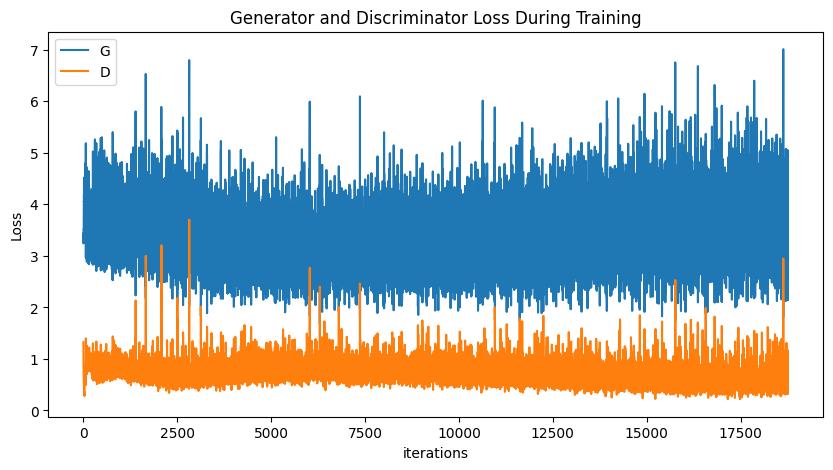

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Progress

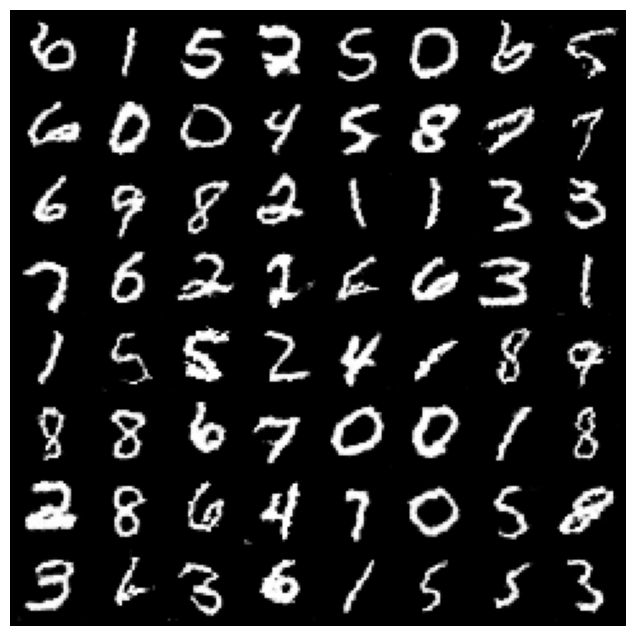

In [22]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

# True vs generated

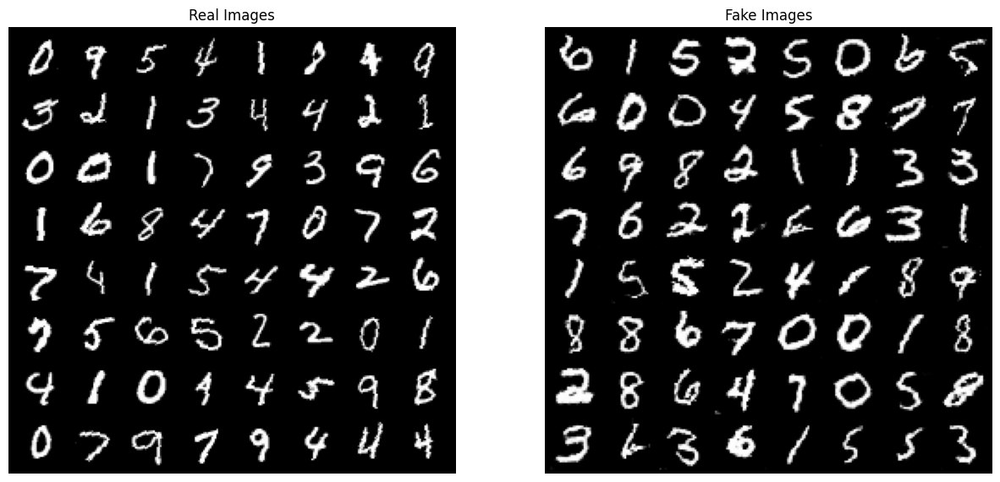

In [23]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(torchvision.utils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

In [24]:
noise = torch.randn(100, INPUT_VECTOR_SIZE, 1, 1, device=device)
noise[:10, :10, 0, 0] = torch.tensor([1, 0, 0, 0, 0, 0, 0, 0, 0, 0])
noise[10:20, :10, 0, 0] = torch.tensor([0, 1, 0, 0, 0, 0, 0, 0, 0, 0])
noise[20:30, :10, 0, 0] = torch.tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 0])
noise[30:40, :10, 0, 0] = torch.tensor([0, 0, 0, 1, 0, 0, 0, 0, 0, 0])
noise[40:50, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 1, 0, 0, 0, 0, 0])
noise[50:60, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 0, 1, 0, 0, 0, 0])
noise[60:70, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 0, 0, 1, 0, 0, 0])
noise[70:80, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 0, 0, 0, 1, 0, 0])
noise[80:90, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 0, 0, 0, 0, 1, 0])
noise[90:100, :10, 0, 0] = torch.tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

# Loading a model with best results
model_gen.load_state_dict(torch.load('GAN64.pth'))

images = model_gen(noise).detach().cpu()
images.size()

torch.Size([100, 1, 28, 28])

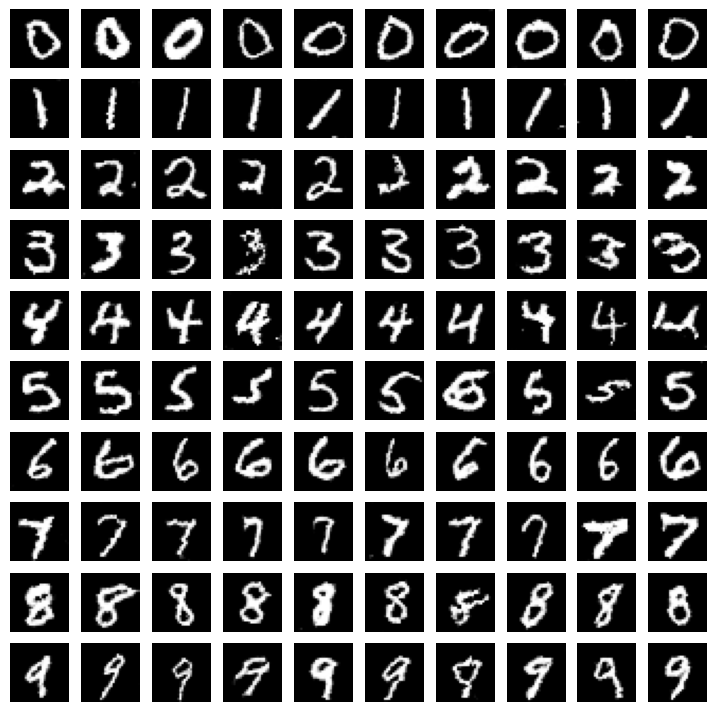

In [25]:
fig = plt.figure(figsize=(9, 9))
rows, cols = 10, 10
for i in range(1, rows*cols+1):
  image = images[i-1]

  fig.add_subplot(rows, cols, i)
  plt.imshow(image.permute(1, 2, 0), cmap="gray")

  plt.axis(False)